In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import category_encoders as ce

In [2]:
# sklearn preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures, QuantileTransformer 
from sklearn.pipeline import Pipeline

# sklearn evaluation
from  sklearn import metrics

# sklearn regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, VotingRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

from xgboost import XGBRegressor
from catboost import CatBoostRegressor

In [3]:
train_df = pd.read_csv("train.csv")
train_df.head()

,Customer_ID,months_as_customer,age,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,...,authorities_contacted,incident_state,incident_city,witnesses,police_report_available,auto_make,auto_model,auto_year,_c39,total_claim_amount
0,Customer_541,239,41,FEMALE,JD,farming-fishing,paintball,other-relative,51400,-6300,...,Police,NC,Arlington,2,YES,Mercedes,E400,2013,NaN,14386.67
1,Customer_440,108,31,MALE,Masters,protective-serv,yachting,not-in-family,0,0,...,Fire,NY,Columbus,2,NO,Dodge,Neon,2006,NaN,76440.00
2,Customer_482,116,30,MALE,JD,handlers-cleaners,golf,not-in-family,0,-35500,...,Other,WV,Riverwood,3,?,Volkswagen,Passat,2004,NaN,79560.00
3,Customer_422,8,21,MALE,High School,handlers-cleaners,hiking,husband,0,0,...,Other,WV,Columbus,0,?,Toyota,Corolla,2012,NaN,121680.00
4,Customer_778,161,38,MALE,PhD,priv-house-serv,exercise,not-in-family,60200,0,...,Police,WV,Springfield,2,YES,Volkswagen,Jetta,2003,NaN,80640.00


In [4]:
test = pd.read_csv("test.csv")
test.head()

,Customer_ID,months_as_customer,age,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,...,incident_severity,authorities_contacted,incident_state,incident_city,witnesses,police_report_available,auto_make,auto_model,auto_year,_c39
0,Customer_521,5,26,FEMALE,PhD,farming-fishing,skydiving,not-in-family,31500,0,...,Total Loss,Ambulance,WV,Springfield,3,?,Audi,A5,2003,NaN
1,Customer_737,160,33,FEMALE,High School,exec-managerial,exercise,husband,61600,0,...,Total Loss,Ambulance,NC,Riverwood,3,YES,Nissan,Pathfinder,2006,NaN
2,Customer_740,385,51,FEMALE,MD,craft-repair,reading,husband,0,-61000,...,Minor Damage,Other,WV,Riverwood,3,?,Suburu,Legacy,2007,NaN
3,Customer_660,446,57,MALE,College,adm-clerical,sleeping,unmarried,42700,-64900,...,Total Loss,Police,SC,Northbrook,0,NO,Jeep,Wrangler,2012,NaN
4,Customer_411,84,29,FEMALE,High School,machine-op-inspct,video-games,not-in-family,0,-29900,...,Trivial Damage,Police,SC,Arlington,0,YES,BMW,3 Series,2005,NaN


In [5]:
submission_df = pd.DataFrame()
submission_df["Customer_ID"] = test["Customer_ID"]

#### DATA DICTIONARY

* customer_ID - System-generated unique customerID
* months_as_customer - number of months a the insured as been a customer
* age - customer age
* insured_education_level - Most recent customers educational qualification
* insured_sex - gender
* insured_occupation - occupation of insured
* insured_hobbies - hobbies of insured
* insured_relationship - insured relationship
* capital-gains - capital gain
* capital-loss - capital-loss
* policy_number - policy_number
* policy_bind_date - policy blind insurance coverage
* policy_state -policy_state
* policy_csl - policy_csl
* policy_deductable -policy_deductable
* incident_location - incident_location
* incident_hour_of_the_day - incident_hour_of_the_day?
* number_of_vehicles_involved -number_of_vehicles_involved
* property_damage - property_damage
* bodily_injuries - bodily_injuries
* policy_annual_premium - policy_annual_premium
* umbrella_limit - umbrella_limit
* insured_zip -insured_zip
* incident_date - incident_date
* incident_type - incident_type
* collision_type - collision_type
* incident_severity - incident_severity
* authorities_contacted - authorities_contacted
* incident_state -incident_state
* incident_city - incident_city
* witnesses - witnesses
* police_report_available - police_report_available
* auto_make - auto_make
* auto_model - auto_model
* auto_year -auto_year
* _c39 - _c39
* total_claim_amount - total_claim_amount

In [6]:
train_df.profile_report()

Summarize dataset:   0%|          | 0/51 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
train_df.columns

Index(['Customer_ID', 'months_as_customer', 'age', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'policy_number', 'policy_bind_date', 'policy_state', 'policy_csl',
       'policy_deductable', 'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city', 'witnesses',
       'police_report_available', 'auto_make', 'auto_model', 'auto_year',
       '_c39', 'total_claim_amount'],
      dtype='object')

In [8]:
train_df["_c39"].isnull().sum()

700

In [9]:
train_df.info()

# train_df["policy_bind_date"].nunique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700 entries, 0 to 699
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Customer_ID                  700 non-null    object 
 1   months_as_customer           700 non-null    int64  
 2   age                          700 non-null    int64  
 3   insured_sex                  700 non-null    object 
 4   insured_education_level      700 non-null    object 
 5   insured_occupation           700 non-null    object 
 6   insured_hobbies              700 non-null    object 
 7   insured_relationship         700 non-null    object 
 8   capital-gains                700 non-null    int64  
 9   capital-loss                 700 non-null    int64  
 10  policy_number                700 non-null    int64  
 11  policy_bind_date             700 non-null    object 
 12  policy_state                 700 non-null    object 
 13  policy_csl          

## Exploratory Data Analysis

In [10]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


<AxesSubplot:xlabel='insured_sex', ylabel='count'>

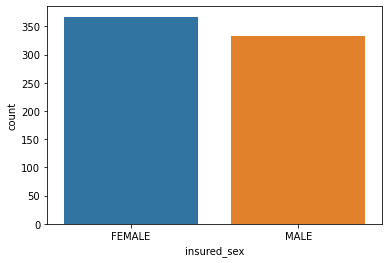

In [11]:
sns.countplot(x="insured_sex", data=train_df)

<AxesSubplot:xlabel='total_claim_amount'>

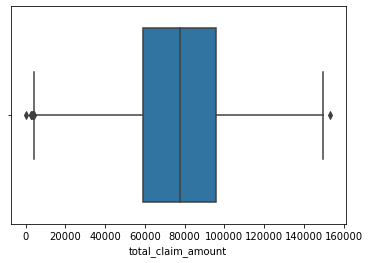

In [12]:
sns.boxplot(x="total_claim_amount", data=train_df)

In [13]:
# # use a for loop to plot each column from your dataframe
# columns = ['months_as_customer', 'age', 'capital-gains', 'capital-loss',
#        'policy_number', 'incident_hour_of_the_day',
#        'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
#        'policy_annual_premium', 'umbrella_limit', 'insured_zip',
#      'auto_year', 'total_claim_amount']
# for column in columns:
#     sns.displot(data= train_df, x= train_df[column], kde=True,)
# #     plt.show()

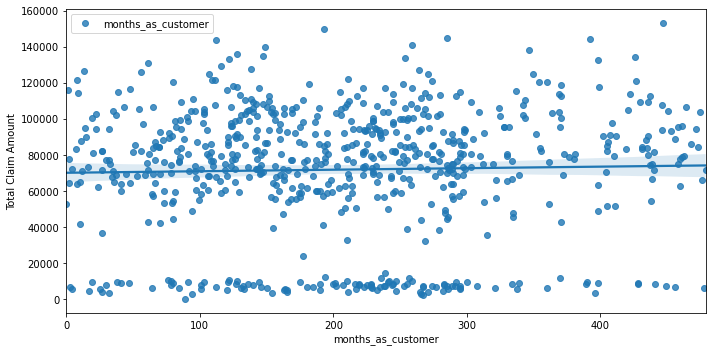

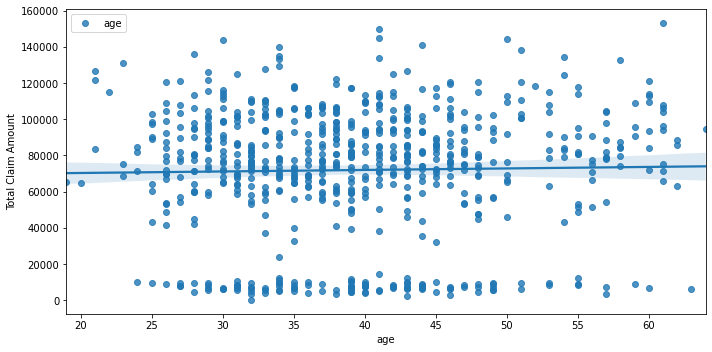

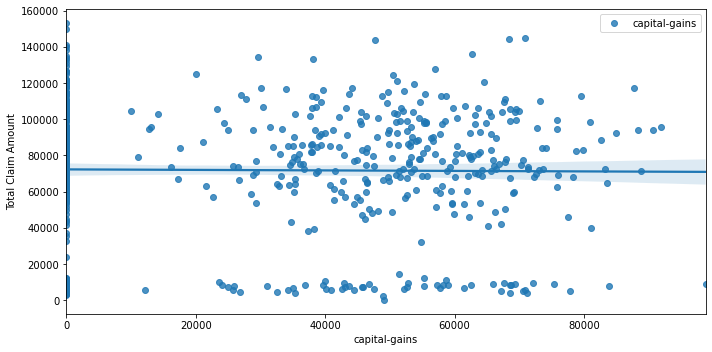

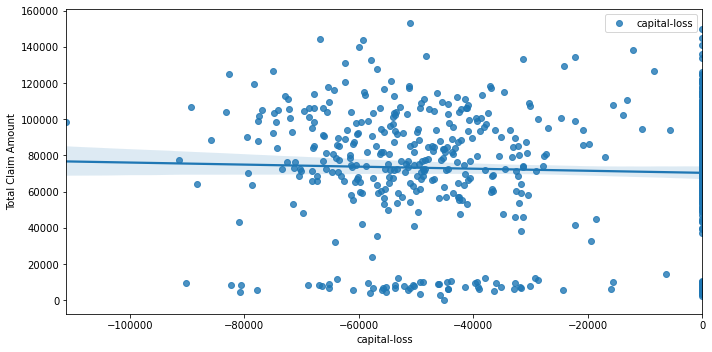

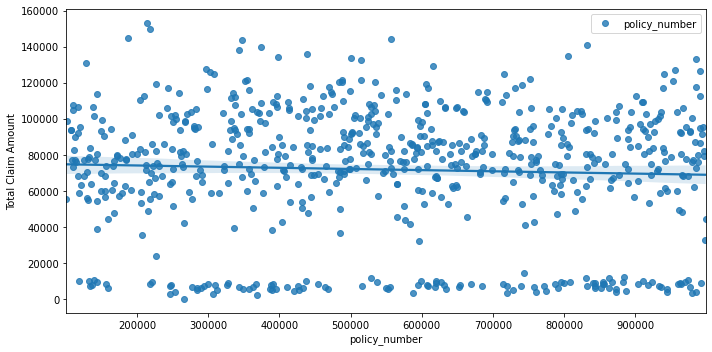

...

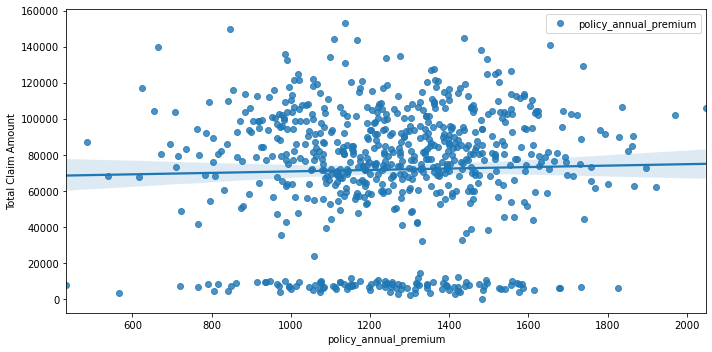

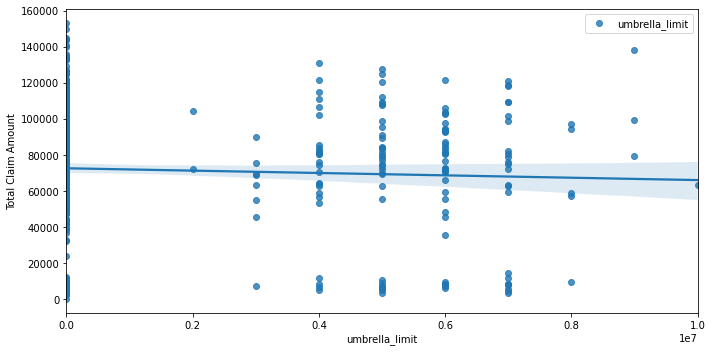

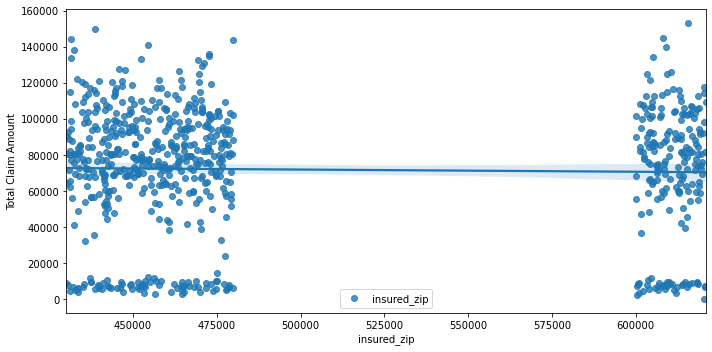

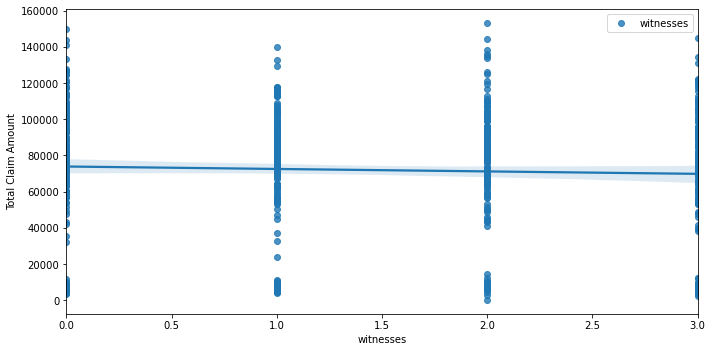

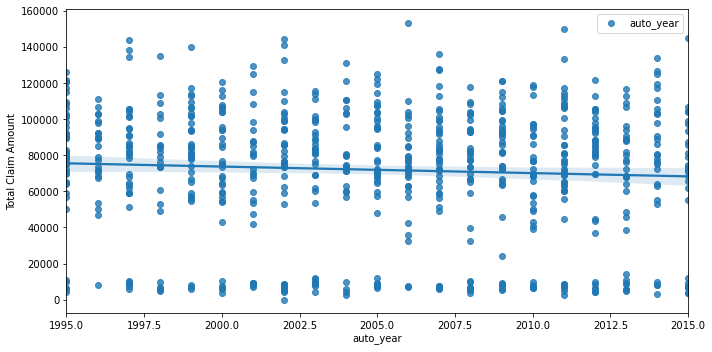

In [14]:
# to make plotting easier we will remove our target variable price from the main dataframe and save it on a separate one:
y = train_df['total_claim_amount']
X = train_df.drop(columns=['total_claim_amount'])
columns = ['months_as_customer', 'age', 'capital-gains', 'capital-loss',
       'policy_number', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
        'witnesses','auto_year']
# we use a for loop to plot our independent variables against our dependent one:
for col in columns:
    plt.figure(figsize=(10,5))
    sns.regplot(x=X[col], y=y, data=X, label=col)
    plt.ylabel('Total Claim Amount')
    plt.xlabel(col)
    plt.legend()
    plt.tight_layout()
    plt.show()

#### Data Preprocessing

* I used catBoosterEncoder to encode features with high cardinality or too maany distinct values and pandas get_dummies for the rest of the categorical features.
* I dropped the columns I no longer need.y= train_df["total_claim_amount"]

In [15]:
cat_features = ["incident_date", "insured_occupation", "auto_model", "auto_make", "insured_education_level", 
                'insured_sex', 'insured_relationship','policy_state', 'policy_csl', 
       'bodily_injuries','incident_type',  'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',]
y = train_df['total_claim_amount']

target_enc = ce.CatBoostEncoder(cols=cat_features)
target_enc.fit_transform(train_df[cat_features], y)
train_df = train_df.join(target_enc.transform(train_df[cat_features]).add_suffix('_cb'))
test = test.join(target_enc.transform(test[cat_features]).add_suffix('_cb'))

/Users/jayne/opt/anaconda3/envs/my-env/lib/python3.8/site-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


In [16]:
def transform_data(df):
#     df.loc[df["police_report_available"]== "?","police_report_available" ]= "Don't Know"
#     df.loc[df["collision_type"] == "?", "collision_type"] ="Rear Collision"
#     df.loc[df["property_damage"] == "?", "property_damage"] ="Partial Damage"
      
    df.drop(["Customer_ID", "_c39", "insured_education_level", "incident_date","incident_location","policy_bind_date", "insured_occupation", "insured_hobbies", "auto_model", "auto_make", 'insured_sex', 'insured_relationship','policy_state', 'policy_csl', 
       'property_damage', 'bodily_injuries','incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city', 'witnesses',
       'police_report_available', 'policy_number','incident_hour_of_the_day', 'insured_zip', 'umbrella_limit', 'auto_year',
       'policy_number','age',], axis=1, inplace=True)
    
    return df

In [17]:
train_df = transform_data(train_df)
train_df.head()

,months_as_customer,capital-gains,capital-loss,policy_deductable,number_of_vehicles_involved,policy_annual_premium,total_claim_amount,incident_date_cb,insured_occupation_cb,auto_model_cb,...,insured_sex_cb,insured_relationship_cb,policy_state_cb,policy_csl_cb,bodily_injuries_cb,incident_type_cb,incident_severity_cb,authorities_contacted_cb,incident_state_cb,incident_city_cb
0,239,51400,-6300,1000,1,1325.44,14386.67,62831.425321,67774.523580,52020.621009,...,72998.607482,71841.046092,71845.674619,70109.948732,72150.330099,8160.361262,8497.835331,64283.370702,68639.745910,70698.134304
1,108,0,0,2000,1,1175.70,76440.00,52875.370459,69367.501698,78911.393082,...,70691.519650,70861.507277,71614.882787,71232.859118,72150.330099,87342.322849,82894.258063,84046.510444,76480.779107,75783.762653
2,116,0,-35500,500,3,951.46,79560.00,66392.506881,84132.025806,67562.437729,...,70691.519650,70861.507277,71614.882787,71232.859118,72150.330099,82187.707762,86071.688964,88063.413089,67785.917155,74131.551110
3,8,0,0,500,1,1021.90,121680.00,59253.875944,84132.025806,63493.966935,...,70691.519650,71908.212421,71614.882787,71232.859118,72150.330099,87342.322849,86071.688964,88063.413089,67785.917155,75783.762653
4,161,60200,0,2000,3,1133.85,80640.00,86762.141451,67942.983627,67087.556878,...,70691.519650,70861.507277,72216.009311,74347.986862,74621.953022,82187.707762,82894.258063,64283.370702,67785.917155,70250.932044


In [18]:
y= train_df["total_claim_amount"]
X= train_df.drop(["total_claim_amount"], axis=1,)

/Users/jayne/opt/anaconda3/envs/my-env/lib/python3.8/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


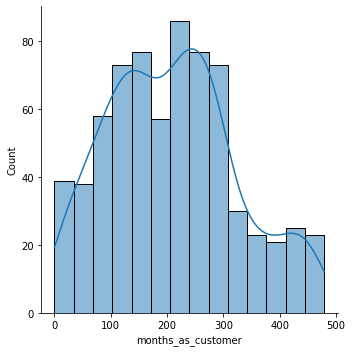

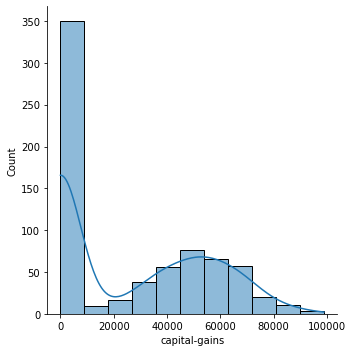

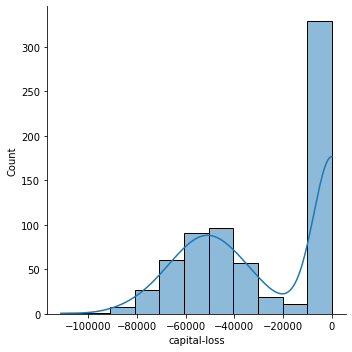

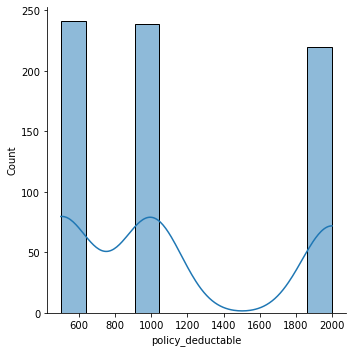

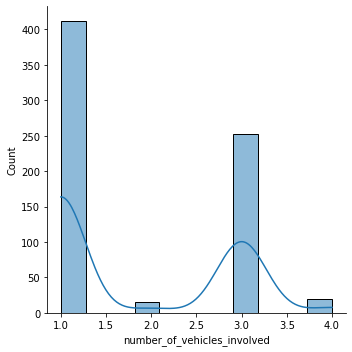

...

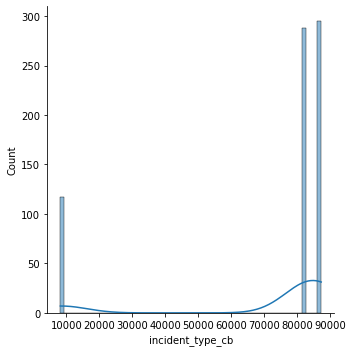

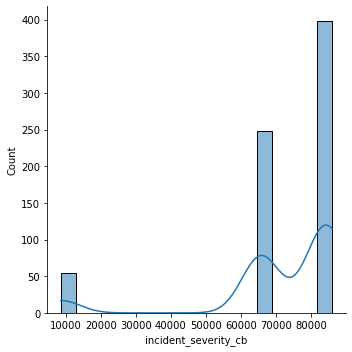

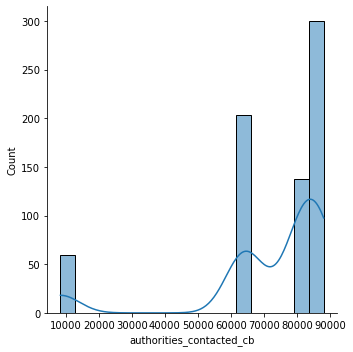

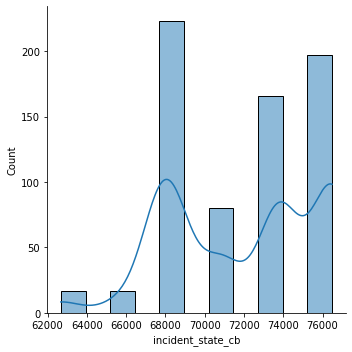

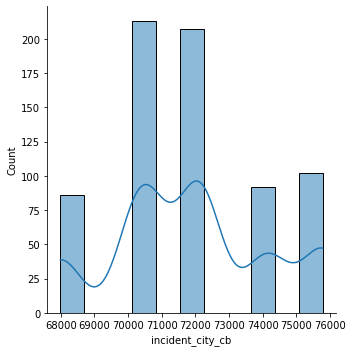

In [19]:
for column in train_df.columns:
    sns.displot(data= train_df, x= train_df[column], kde=True,)

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=3)

In [21]:

# construct pipeline
scaler = StandardScaler()
quantile = QuantileTransformer( output_distribution='normal', random_state=5, n_quantiles=100)
poly_features = PolynomialFeatures(degree=2)
lin_reg = RandomForestRegressor(random_state=0)

pipe = Pipeline([
    ('scaler', scaler),('quantile', quantile), ('poly', poly_features), ('regressor', lin_reg)
])

In [22]:
pipe.named_steps

{'scaler': StandardScaler(),
 'quantile': QuantileTransformer(n_quantiles=100, output_distribution='normal',
                     random_state=5),
 'poly': PolynomialFeatures(),
 'regressor': RandomForestRegressor(random_state=0)}

In [23]:
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
print(metrics.r2_score(y_test, y_pred))

0.6710398711420067


#### Model Evaluation



In [24]:
models = [LinearRegression(), RandomForestRegressor(random_state=0, n_estimators=50), DecisionTreeRegressor(), XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', use_label_encoder=False,
             validate_parameters=1, verbosity=None), KNeighborsRegressor(),SVR(), Ridge(alpha=0.05, normalize=True), Lasso(alpha=0.3, normalize=True), GradientBoostingRegressor(), AdaBoostRegressor(random_state=0, n_estimators=100), pipe, CatBoostRegressor(iterations=30, depth=3, learning_rate=0.1, random_state=0, loss_function='RMSE')]

In [25]:
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    MSE = metrics.mean_squared_error(y_test,predictions )
    print(type(model).__name__, metrics.mean_absolute_error(y_test, predictions), "       Root mean squared error", np.sqrt(MSE), "  ---R2 ",metrics.r2_score(y_test, predictions))

LinearRegression 14609.767044154443        Root mean squared error 18844.08202976103   ---R2  0.6726722539234591
RandomForestRegressor 14081.423165714285        Root mean squared error 18727.128419473618   ---R2  0.6767226889291804
DecisionTreeRegressor 22691.714285714286        Root mean squared error 29552.682669612317   ---R2  0.1949429292046566


/Users/jayne/opt/anaconda3/envs/my-env/lib/python3.8/site-packages/xgboost/data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(


XGBRegressor 15442.030955705915        Root mean squared error 20235.728357457945   ---R2  0.6225403528901128
KNeighborsRegressor 14658.990585714284        Root mean squared error 19636.170303583807   ---R2  0.6445762637011928
SVR 24419.623745108624        Root mean squared error 32925.52675846078   ---R2  0.0006944226023004596
Ridge 14703.086266316814        Root mean squared error 19024.816402939694   ---R2  0.6663633156659943
Lasso 14610.19626978552        Root mean squared error 18842.804651306924   ---R2  0.6727166293658999
GradientBoostingRegressor 14781.308316909039        Root mean squared error 18956.54304189212   ---R2  0.6687536279114672
AdaBoostRegressor 15215.659608353964        Root mean squared error 20220.113433357143   ---R2  0.6231226625138759
Pipeline 14446.101372142855        Root mean squared error 18891.011292223164   ---R2  0.6710398711420067
0:	learn: 32980.3357819	total: 54.8ms	remaining: 1.59s
1:	learn: 30969.4362412	total: 55.8ms	remaining: 781ms
2:	learn: 29

Work on my test data

In [26]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 51 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Customer_ID                  300 non-null    object 
 1   months_as_customer           300 non-null    int64  
 2   age                          300 non-null    int64  
 3   insured_sex                  300 non-null    object 
 4   insured_education_level      300 non-null    object 
 5   insured_occupation           300 non-null    object 
 6   insured_hobbies              300 non-null    object 
 7   insured_relationship         300 non-null    object 
 8   capital-gains                300 non-null    int64  
 9   capital-loss                 300 non-null    int64  
 10  policy_number                300 non-null    int64  
 11  policy_bind_date             300 non-null    object 
 12  policy_state                 300 non-null    object 
 13  policy_csl          

In [27]:
test = transform_data(test)
test.head()

,months_as_customer,capital-gains,capital-loss,policy_deductable,number_of_vehicles_involved,policy_annual_premium,incident_date_cb,insured_occupation_cb,auto_model_cb,auto_make_cb,...,insured_sex_cb,insured_relationship_cb,policy_state_cb,policy_csl_cb,bodily_injuries_cb,incident_type_cb,incident_severity_cb,authorities_contacted_cb,incident_state_cb,incident_city_cb
0,5,31500,0,2000,1,1137.02,66545.949152,67774.523580,74214.379661,74730.539183,...,72998.607482,70861.507277,72216.009311,70109.948732,68880.377428,87342.322849,82894.258063,80156.505131,67785.917155,70250.932044
1,160,61600,0,1000,3,1422.78,67249.815632,76838.751607,73551.254692,72417.424689,...,72998.607482,71908.212421,72216.009311,71232.859118,74621.953022,82187.707762,82894.258063,80156.505131,68639.745910,74131.551110
2,385,0,-61000,1000,3,976.37,62831.425321,76600.672024,69641.713661,73129.822612,...,72998.607482,71908.212421,71614.882787,70109.948732,68880.377428,82187.707762,65821.128286,88063.413089,67785.917155,74131.551110
3,446,42700,-64900,2000,3,1373.21,92226.189435,67284.236800,72392.772742,70673.721171,...,70691.519650,70968.309835,71614.882787,74347.986862,72150.330099,82187.707762,82894.258063,64283.370702,73782.560259,67990.432221
4,84,0,-29900,1000,1,1117.17,72108.277170,73559.921277,88642.446658,78379.046968,...,72998.607482,70861.507277,71845.674619,70109.948732,74621.953022,8160.361262,8497.835331,64283.370702,73782.560259,70698.134304


In [28]:
# test.profile_report()

In [29]:
rf = RandomForestRegressor(random_state=0, n_estimators=50)
rf.fit(X_train, y_train)
pre = rf.predict(test)

<BarContainer object of 21 artists>

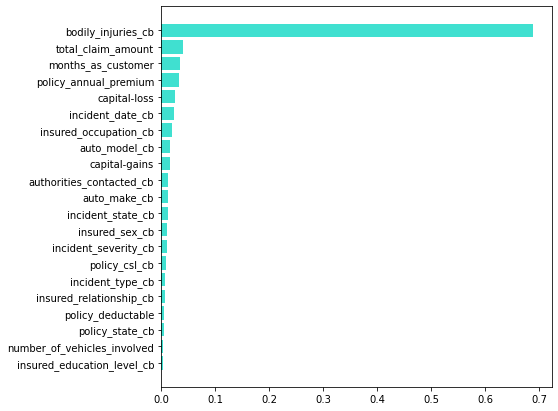

In [30]:

sorted_feature_importance = rf.feature_importances_.argsort()
plt.figure(figsize=(7,7))
plt.barh(train_df.columns[sorted_feature_importance],
rf.feature_importances_[sorted_feature_importance],color='turquoise')

In [31]:
# submission_df["total_claim_amount"] = cat_prediction
# submission_df.to_csv("submission.csv", index=False)
# submission_df.head()

In [32]:
reg1 =LinearRegression()
reg2 = RandomForestRegressor(random_state=1)
reg3 = pipe
reg4 = Lasso(alpha=0.3, normalize=True)
ereg = VotingRegressor(estimators=[('gb', reg2), ('cb', reg3), ('ty', reg1), ('ji', reg4)])
ereg.fit(X_train, y_train)
predd = ereg.predict(X_test)

In [33]:
rmse = np.sqrt(metrics.mean_squared_error(y_test,predd))
r2 = metrics.r2_score(y_test, predd)

print("Testing performance")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 18634.30
R2: 0.68


In [34]:
voting_pred = ereg.predict(test)

In [35]:
predicter = pipe.predict(test)

In [36]:
submission_df["total_claim_amount"] = voting_pred
submission_df.to_csv("submission.csv", index=False)
submission_df.head()

,Customer_ID,total_claim_amount
0,Customer_521,77844.826986
1,Customer_737,79185.635562
2,Customer_740,80981.016958
3,Customer_660,91831.099534
4,Customer_411,12482.554612
